# Predicting individual cell responses to pharmacologic compounds with Shennong framework
### Visualization the latent space of the dataset and the influence term score for each cell

In [1]:
import warnings
warnings.simplefilter(action='ignore')

In [2]:
import scanpy as sc
import torch
import scarches as sca
import pandas as pd
import numpy as np
import gdown

 captum (see https://github.com/pytorch/captum).
INFO:lightning_fabric.utilities.seed:Global seed set to 0


In [3]:
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sb
import os
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

In [4]:
sc.set_figure_params(frameon=False)
sc.settings.set_figure_params(dpi=300,dpi_save=600, facecolor='white')
sc.set_figure_params(figsize=(6, 6))
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

In [5]:
sc.settings.verbosity = 3

# Step0 

## Step0_1 Data_info and Model_dir

In [6]:
adata_train = 'train_gmt.h5ad'
adata_train_umap = 'train_gmt_umap.h5ad'
adata_train_umap_metadata = 'train_gmt_umap_metadata.csv'

adata_query = 'query.h5ad'
adata_query_output = 'query_gmt.h5ad'
adata_query_metadata = 'query_gmt_umap_metadata.csv'

adata_train_query = 'train_query_gmt.h5ad'
adata_train_query_metadata = 'train_query_gmt_umap_metadata.csv'

In [7]:
model_train_dir = 'train_normal'
model_query_dir = 'query_normal'

In [8]:
output_dir = 'output/'
output_gene_dir = 'output/term_gene/'

if (os.path.exists(output_dir) != True):
    os.mkdir(output_dir)
if (os.path.exists(output_gene_dir) != True):
    os.mkdir(output_gene_dir)

## Step0_2 expiMap: Load Train_data and Train_model

In [9]:
adata = sc.read_h5ad(adata_train)
adata.obs['batch'] = adata.obs['Tissue_Source']
adata.varm['I'].shape

In [12]:
intr_cvae = sca.models.EXPIMAP.load(dir_path = model_train_dir, adata = adata)

AnnData object with n_obs × n_vars = 346129 × 8500
    obs: 'Cell', 'nCount_RNA', 'nFeature_RNA', 'reads', 'depth', 'percent.mt', 'Sample_Name', 'Patient', 'Cancer_Type', 'Tissue_Source', 'Cluster', 'Celltype', 'Celllineage', 'Annotation', 'sample_cluster', 'sample_celltype', 'sample_lineage', 'Tissue', 're_clusters', 're_annotation', 're_cluster_annotation', 're_clusters_raw', 'Malignangt', 're_cluster_merge', 're_cluster_merge2', 'batch'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg', 'log1p', 'terms'
    varm: 'I'
    layers: 'counts'

INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 8500 512 3
	Hidden Layer 1 in/out: 512 512
	Hidden Layer 2 in/out: 512 512
	Hidden Layer 3 in/out: 512 512
	Hidden Layer 4 in/out: 512 512
	Mean/Var Layer in/out: 512 17276
Decoder Architecture:
	Masked linear layer in, ext_m, ext, cond, out:  17276 0 0 3 8500
	with hard mask.
Last Decoder la

## Step0_3 Plot the latent space of the reference.

In [14]:
MEAN = False

In [15]:
adata.obsm['X_cvae'] = intr_cvae.get_latent(mean=MEAN, only_active=True)

In [ ]:
adata.obs['re_annotation_use'] = adata.obs['re_annotation'].str.replace(r'_.*high','')

In [18]:
sc.pp.neighbors(adata, use_rep='X_cvae')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:10:07)


In [19]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:06:14)


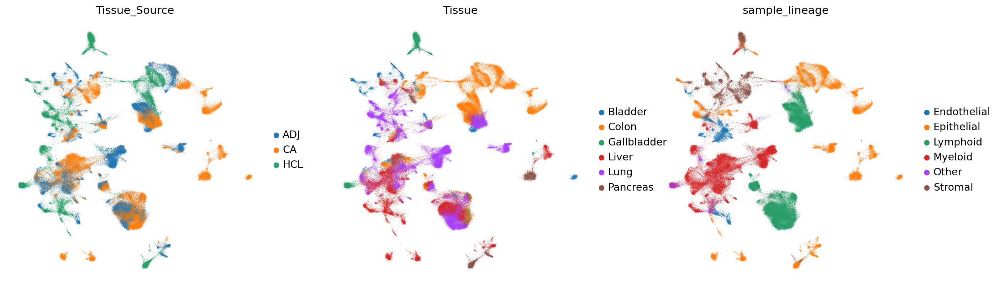

In [20]:
sc.pl.umap(adata, color=['Tissue_Source', 'Tissue', 'sample_lineage'], frameon=False)

In [45]:
adata_meta = adata.obs
adata_meta_umap = pd.DataFrame(adata.obsm['X_umap'], index = adata.obs.index, columns = ['umap_1', 'umap_2'])
adata_meta = pd.concat([adata_meta, adata_meta_umap], axis = 1)
adata_meta.head()
adata_meta.to_csv(adata_train_umap_metadata)

# Step1 Referece mapping while learning new varation from query data with extension nodes

## Step1_1 Query_data and Query_model

In [49]:
query = sc.read(adata_query)

In [50]:
query = query[:, query.var_names & adata.var_names].copy()
df_query = pd.DataFrame.sparse.from_spmatrix(query.X, columns = query.var_names, index = query.obs_names)
df_queryadd = pd.DataFrame(index = query.obs.index, columns = adata.var_names.difference(query.var_names))
df_query = df_query.merge(df_queryadd, left_index = True, right_index = True, how = 'left')
df_query = df_query.fillna(0)

query = sc.AnnData(df_query, obs = query.obs)
query.X = query.X.astype('int32')

query.layers["counts"] = query.X.copy()
# query.obs['study'] = query.obs['batch']
query.obs['batch'] = 'Query'
query.uns['terms'] = adata.uns['terms']
query.write(adata_query_output, compression = True)

In [16]:
q_intr_cvae = sca.models.EXPIMAP.load(dir_path = model_query_dir, adata = query)

AnnData object with n_obs × n_vars = 42517 × 8500
    obs: 'Cell', 'nCount_RNA', 'nFeature_RNA', 'reads', 'depth', 'percent.mt', 'Sample_Name', 'Patient', 'Cancer_Type', 'Tissue_Source', 'Cluster', 'Celltype', 'Celllineage', 'Annotation', 'sample_cluster', 'sample_celltype', 'sample_lineage', 'Tissue', 're_clusters', 're_annotation', 're_cluster_annotation', 're_clusters_raw', 'Malignangt', 're_cluster_merge', 're_cluster_merge2', 'batch'
    uns: 'terms'
    layers: 'counts'

INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 8500 512 3
	Hidden Layer 1 in/out: 512 512
	Hidden Layer 2 in/out: 512 512
	Hidden Layer 3 in/out: 512 512
	Hidden Layer 4 in/out: 512 512
	Mean/Var Layer in/out: 512 17276
Decoder Architecture:
	Masked linear layer in, ext_m, ext, cond, out:  17276 0 0 3 8500
	with hard mask.
Last Decoder layer: softmax


## query train

In [55]:
q_intr_cvae = sca.models.EXPIMAP.load_query_data(query, intr_cvae)

AnnData object with n_obs × n_vars = 42517 × 8500
    obs: 'Cell', 'nCount_RNA', 'nFeature_RNA', 'reads', 'depth', 'percent.mt', 'Sample_Name', 'Patient', 'Cancer_Type', 'Tissue_Source', 'Cluster', 'Celltype', 'Celllineage', 'Annotation', 'sample_cluster', 'sample_celltype', 'sample_lineage', 'Tissue', 're_clusters', 're_annotation', 're_cluster_annotation', 're_clusters_raw', 'Malignangt', 're_cluster_merge', 're_cluster_merge2', 'batch'
    uns: 'terms'
    layers: 'counts'

INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 8500 512 3
	Hidden Layer 1 in/out: 512 512
	Hidden Layer 2 in/out: 512 512
	Hidden Layer 3 in/out: 512 512
	Hidden Layer 4 in/out: 512 512
	Mean/Var Layer in/out: 512 17276
Decoder Architecture:
	Masked linear layer in, ext_m, ext, cond, out:  17276 0 0 3 8500
	with hard mask.
Last Decoder layer: softmax


In [56]:
q_intr_cvae.train(n_epochs=500, 
                  alpha_epoch_anneal=130, 
                  weight_decay=0., 
                  alpha_kl=0.00001, 
                  seed=2020, 
                  use_early_stopping=True,
                 print_n_deactive=True,
                 print_stats=True )

 |██████████----------| 51.8%  - val_loss: 1069.2232576258 - val_recon_loss: 1069.0707971909 - val_kl_loss: 15245.3721564798
ADJUSTED LR
 |██████████----------| 53.2%  - val_loss: 1063.1986604578 - val_recon_loss: 1063.0462143842 - val_kl_loss: 15244.0007755055
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 244


In [57]:
q_intr_cvae.save(model_query_dir)

## Step1_2 Analysis of reference + query dataset

## Query

In [59]:
MEAN = False

In [60]:
query.obsm['X_cvae'] = q_intr_cvae.get_latent(mean=MEAN, only_active=True)

In [61]:
query.obs['re_annotation_use'] = query.obs['re_annotation'].str.replace(r'_.*high','')
query.obs.head()

,Cell,nCount_RNA,nFeature_RNA,reads,depth,percent.mt,Sample_Name,Patient,Cancer_Type,Tissue_Source,...,Tissue,re_clusters,re_annotation,re_cluster_annotation,re_clusters_raw,Malignangt,re_cluster_merge,re_cluster_merge2,batch,re_annotation_use
BC_1790_CA_4.GCGAATACCTGATTCATA,BC_1790_CA_4.GCGAATACCTGATTCATA,1940,1189,25471.0,13.115860,9.268795,BC_1790_CA,BC_1790,BC,CA,...,Bladder,C12,Epithelial cell,C12_Epithelial cell,12,Malignant,Epithelial.C12,Epithelial.C12_Epithelial cell,Query,Epithelial cell
BC_1790_CA_4.CTCCATTATGTAATGCTT,BC_1790_CA_4.CTCCATTATGTAATGCTT,1856,901,21911.0,11.805496,20.096983,BC_1790_CA,BC_1790,BC,CA,...,Bladder,C0,Monocyte_CXCL2 high,C0_Monocyte_CXCL2 high,0,Other,Myeloid.C0,Myeloid.C0_Monocyte_CXCL2 high,Query,Monocyte
BC_1790_CA_4.GAACGCTAGTCGACAATA,BC_1790_CA_4.GAACGCTAGTCGACAATA,2514,1108,20281.0,8.060811,12.440382,BC_1790_CA,BC_1790,BC,CA,...,Bladder,C11,Proliferating plasma cell,C11_Proliferating plasma cell,16,Other,Lymphoid.C11,Lymphoid.C11_Proliferating plasma cell,Query,Proliferating plasma cell
BC_1790_CA_4.ATTTGCTGTGCGAATAAA,BC_1790_CA_4.ATTTGCTGTGCGAATAAA,2509,1151,18866.0,7.516335,24.183267,BC_1790_CA,BC_1790,BC,CA,...,Bladder,C12,Epithelial cell,C12_Epithelial cell,12,Malignant,Epithelial.C12,Epithelial.C12_Epithelial cell,Query,Epithelial cell
BC_1790_CA_4.GAACGCATCTCTGTCCCG,BC_1790_CA_4.GAACGCATCTCTGTCCCG,1560,754,16926.0,10.829175,23.800384,BC_1790_CA,BC_1790,BC,CA,...,Bladder,C12,Epithelial cell,C12_Epithelial cell,12,Malignant,Epithelial.C12,Epithelial.C12_Epithelial cell,Query,Epithelial cell


In [62]:
sc.pp.neighbors(query, use_rep='X_cvae')
sc.tl.umap(query)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:55)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:31)


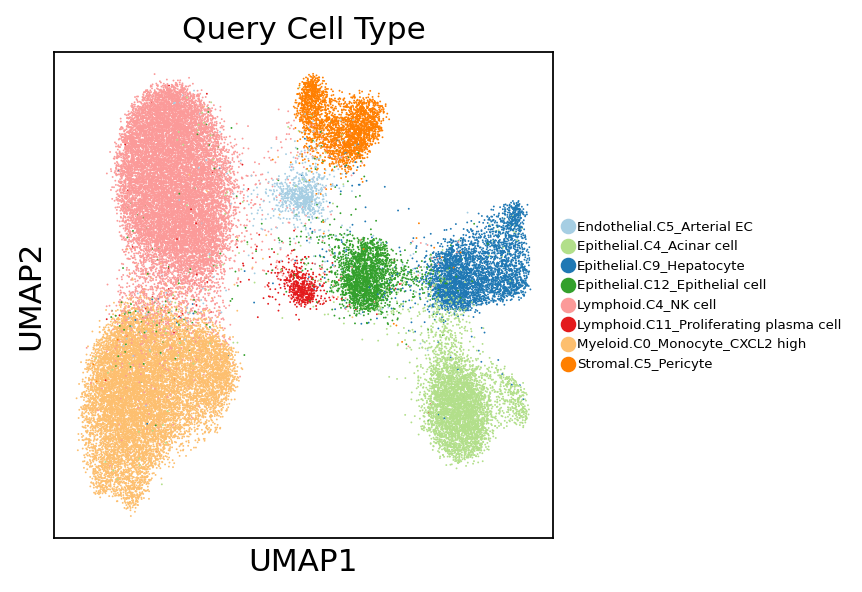

In [67]:
query.uns['re_cluster_merge2_colors'] = ["#A6CEE3", "#B2DF8A", "#1F78B4", "#33A02C", "#FB9A99", 
                                         "#E31A1C", "#FDBF6F", "#FF7F00", "#CAB2D6"]
sc.pl.umap(query, color=['re_cluster_merge2'], title = 'Query Cell Type', legend_fontsize=6)

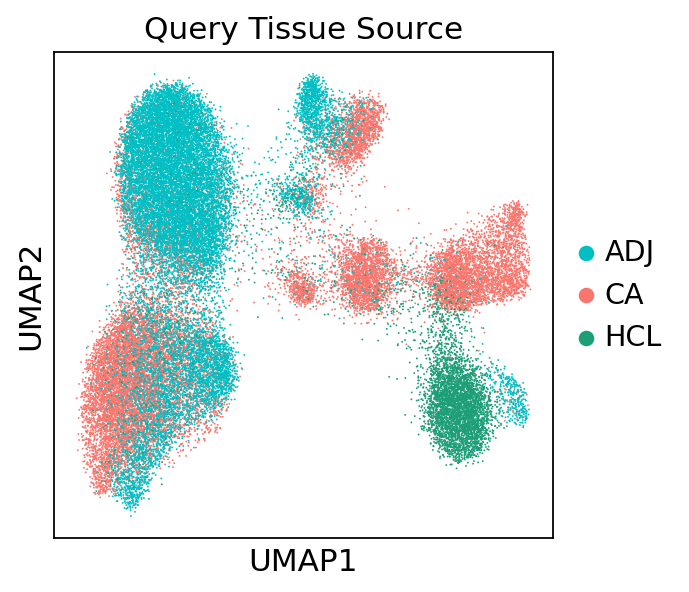

In [70]:
query.uns['Tissue_Source_colors'] = ['#00BFC4', '#F8766D', '#1C9E77']
sc.pl.umap(query, color=['Tissue_Source'], title = 'Query Tissue Source', frameon=True)

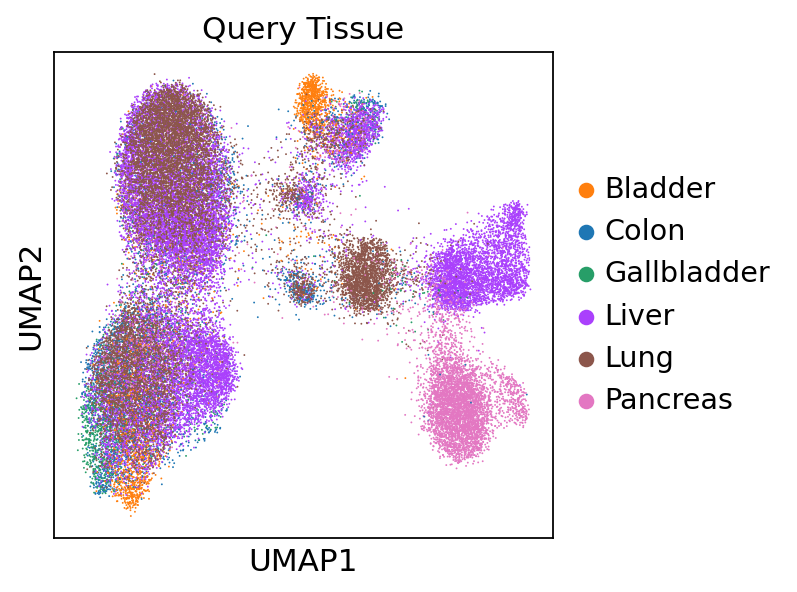

In [71]:
query.uns['Tissue_colors'] = ['#ff7f0e', '#1f77b4', '#279e68', '#aa40fc', '#8c564b', '#e377c2']
sc.pl.umap(query, color=['Tissue'], title = 'Query Tissue', frameon=True)

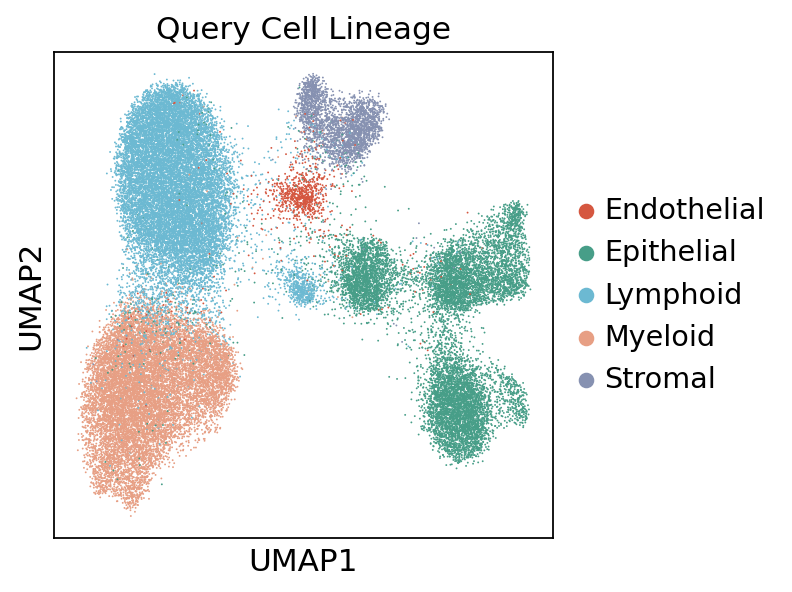

In [72]:
query.uns['sample_lineage_colors'] = ["#d55740", "#479e88", "#6cb9d2", "#e79f84", "#8691b1"] # 
sc.pl.umap(query, color=['sample_lineage'], title = 'Query Cell Lineage', frameon=True)

In [75]:
query_meta = query.obs
query_meta_umap = pd.DataFrame(query.obsm['X_umap'], index = query.obs.index, columns = ['umap_1', 'umap_2'])
query_meta = pd.concat([query_meta, query_meta_umap], axis = 1)
query_meta.to_csv(adata_query_metadata)

## Train & Query

In [18]:
query_pbmc = sc.AnnData.concatenate(adata, query, batch_key='batch_join', uns_merge='same')
query_pbmc.obs['re_annotation_use'] = query_pbmc.obs['re_annotation'].str.replace(r'_.*high','')

In [19]:
query_pbmc

AnnData object with n_obs × n_vars = 388646 × 8500
    obs: 'Cell', 'nCount_RNA', 'nFeature_RNA', 'reads', 'depth', 'percent.mt', 'Sample_Name', 'Patient', 'Cancer_Type', 'Tissue_Source', 'Cluster', 'Celltype', 'Celllineage', 'Annotation', 'sample_cluster', 'sample_celltype', 'sample_lineage', 'Tissue', 're_clusters', 're_annotation', 're_cluster_annotation', 're_clusters_raw', 'Malignangt', 're_cluster_merge', 're_cluster_merge2', 'batch', 'batch_join'
    var: 'n_cells-0', 'highly_variable-0', 'highly_variable_rank-0', 'means-0', 'variances-0', 'variances_norm-0'
    uns: 'terms'
    layers: 'counts'

In [21]:
q_intr_cvae.latent_directions(adata = query_pbmc)

## Step 1_3 Plot

In [26]:
MEAN = False

In [27]:
query_pbmc.obsm['X_cvae'] = q_intr_cvae.get_latent(query_pbmc.X, 
                                                   query_pbmc.obs['Tissue_Source'], 
                                                   mean=MEAN, 
                                                   only_active=True)

In [29]:
sc.pp.neighbors(query_pbmc, use_rep='X_cvae')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:12:54)


In [30]:
sc.tl.umap(query_pbmc)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:06:55)


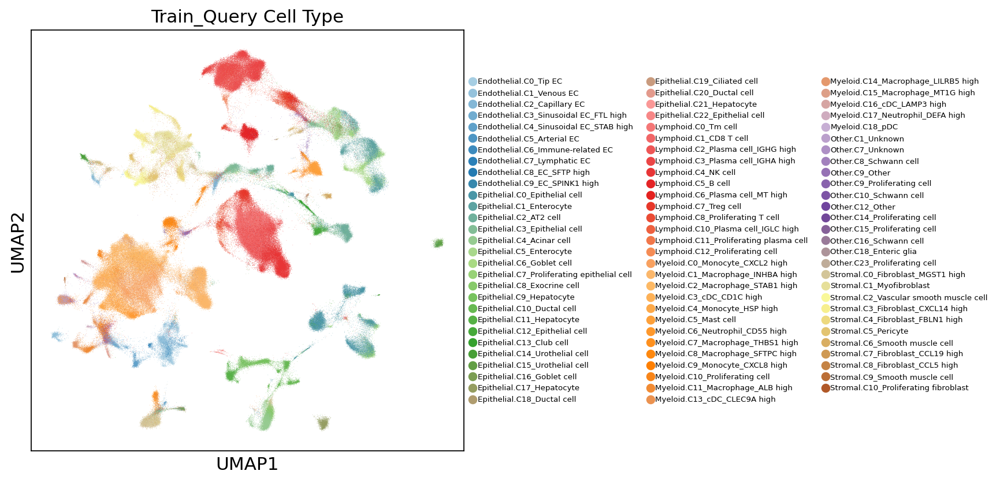

In [32]:
query_pbmc.uns['re_cluster_merge2_colors'] = ["#A6CEE3", "#94C2DC", "#83B7D6", "#71ACD0", "#60A1CA", "#4E96C4", "#3D8BBE", "#2B80B8", "#247BB2", "#3788AD", "#4A96A7", "#5DA3A2", "#70B09C", "#83BE97", "#96CB91", "#A9D88C", "#A9DA83", "#98D277", "#88CA6B", "#77C25E", "#67B952", "#56B146", "#46A93A", "#35A12E", "#489F37", "#629E45", "#7B9D53", "#959D61", "#AF9C6F", "#C99B7E", "#E39A8C", "#FA9897", "#F78787", "#F47777", "#F16667", "#EE5656", "#EB4546", "#E83536", "#E42426", "#E4211F", "#E7372A", "#EA4C35", "#EE6140", "#F1774A", "#F58C55", "#F8A160", "#FBB76B", "#FDB965", "#FDB157", "#FDA949", "#FDA03A", "#FE982C", "#FE901E", "#FE880F", "#FE7F01", "#F88519", "#F18B34", "#EB9250", "#E4986C", "#DD9F87", "#D6A5A3", "#CFACBF", "#C7AFD4", "#BBA0CC", "#AE90C5", "#A281BD", "#9672B5", "#8963AD", "#7D54A5", "#70459E", "#724899", "#866199", "#997A99", "#AC9399", "#BFAC99", "#D3C599", "#E6DF99", "#F9F899", "#F7EF8E", "#EDD97F", "#E3C471", "#D9AE62", "#CF9953", "#C58345", "#BB6E36", "#B15928"]
sc.pl.umap(query_pbmc, color=['re_cluster_merge2'], title='Train_Query Cell Type', legend_fontsize=6) 

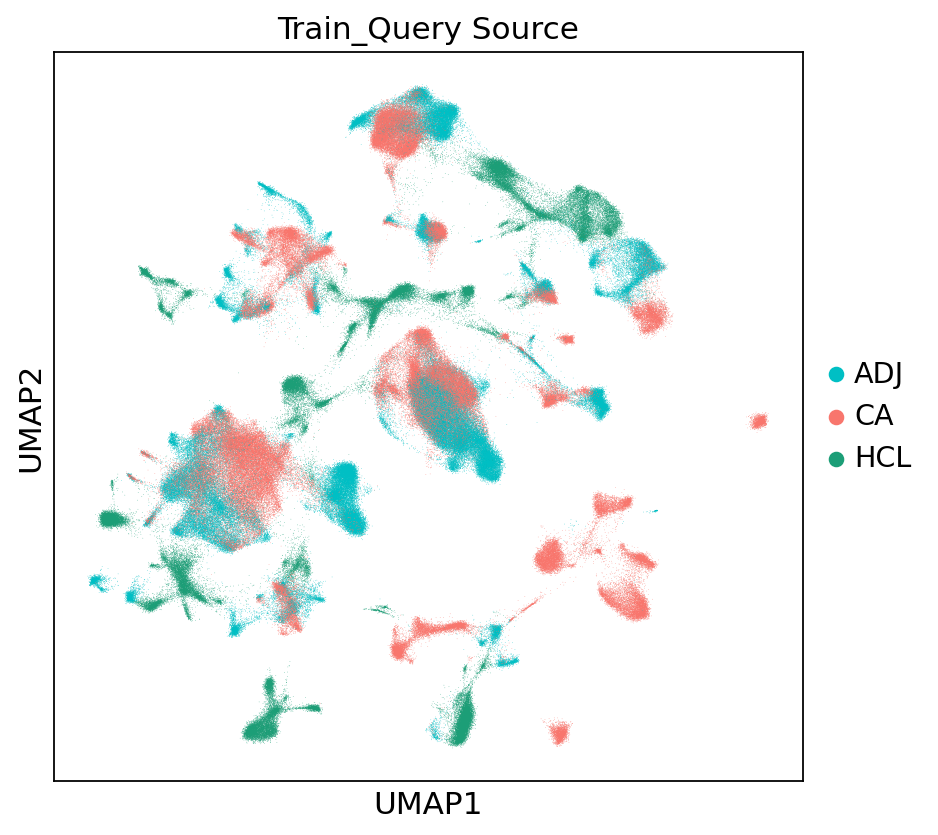

In [36]:
query_pbmc.uns['Tissue_Source_colors'] = ['#00BFC4', '#F8766D', '#1C9E77']
sc.pl.umap(query_pbmc, color=['Tissue_Source'], title='Train_Query Source', frameon=True)

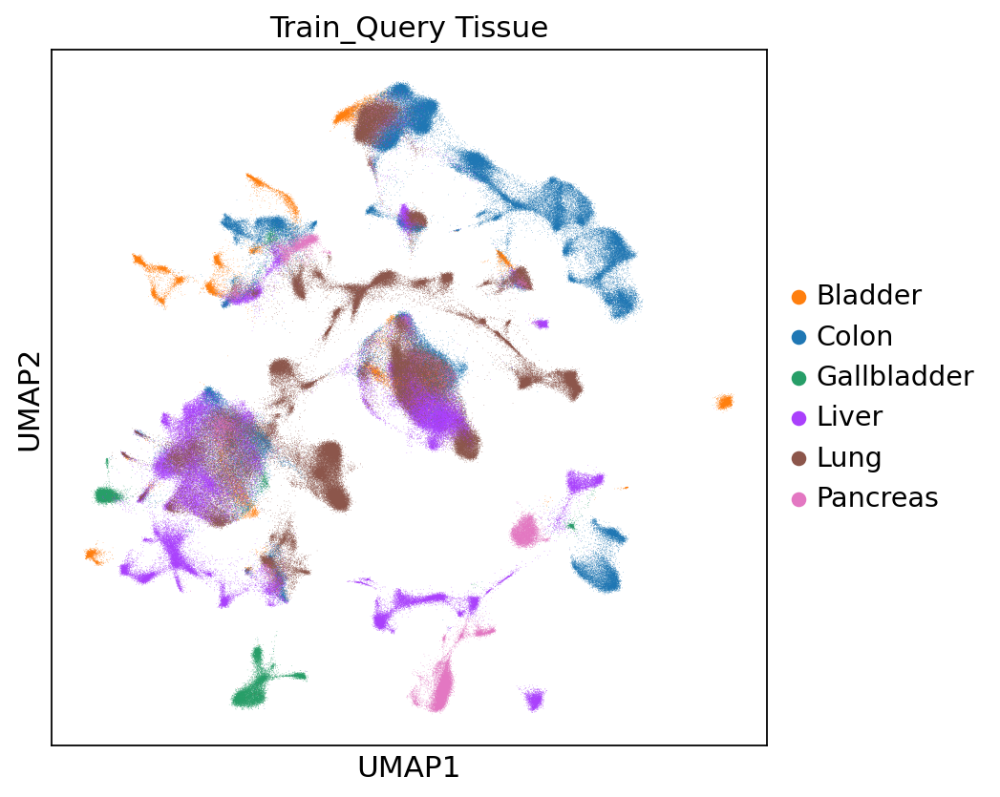

In [37]:
query_pbmc.uns['Tissue_colors'] = ['#ff7f0e', '#1f77b4', '#279e68', '#aa40fc', '#8c564b', '#e377c2']
sc.pl.umap(query_pbmc, color=['Tissue'], title = 'Train_Query Tissue', frameon=True)

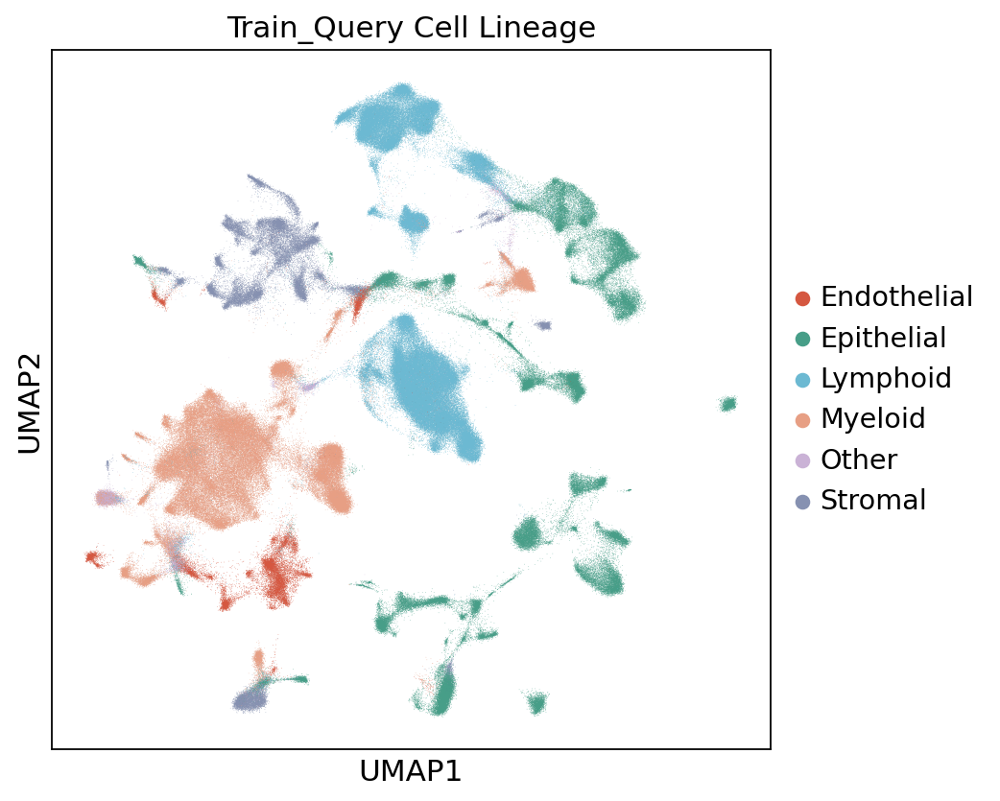

In [38]:
query_pbmc.uns['sample_lineage_colors'] = ["#d55740", "#479e88", "#6cb9d2", "#e79f84", "#CAB2D6", "#8691b1"]
sc.pl.umap(query_pbmc, color=['sample_lineage'], title = 'Train_Query Cell Lineage', frameon=True)

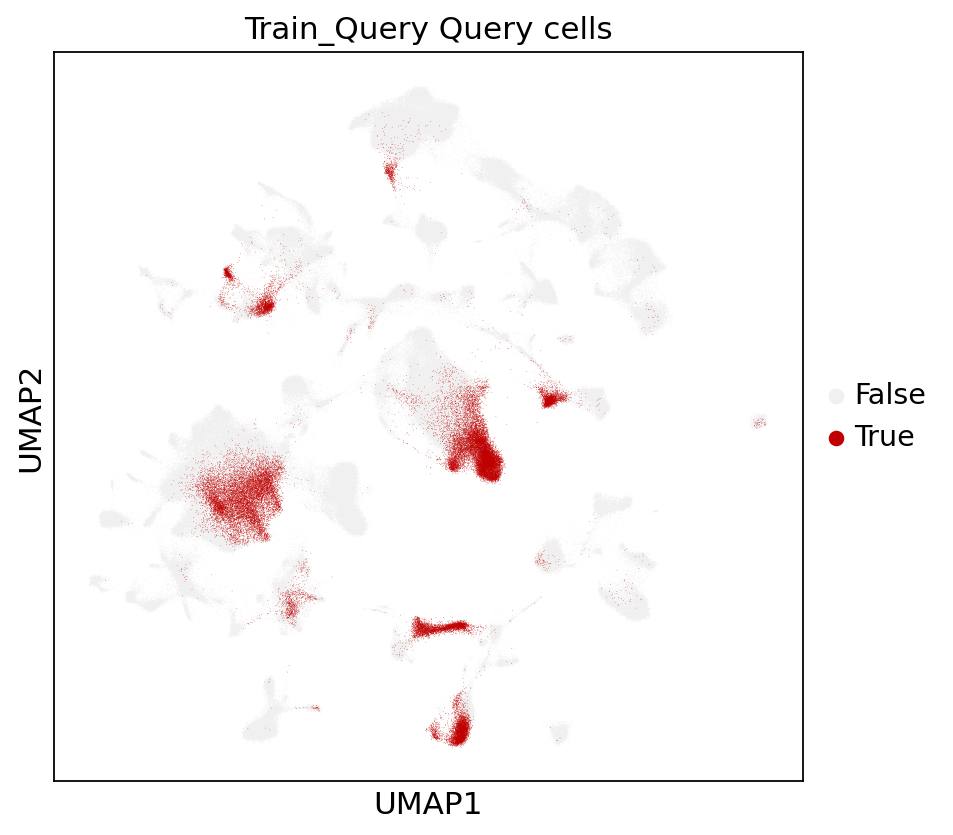

In [40]:
query_pbmc.obs['selection'] = pd.Categorical((query_pbmc.obs['batch'] == 'Query'))
query_pbmc.uns['selection_colors'] = ['#f0f0f0', '#C00000']
sc.pl.umap(query_pbmc, color='selection', title = 'Train_Query Query cells', frameon=True)

In [44]:
query_pbmc_meta = query_pbmc.obs
query_pbmc_meta_umap = pd.DataFrame(query_pbmc.obsm['X_umap'], index = query_pbmc.obs.index, columns = ['umap_1', 'umap_2'])
query_pbmc_meta = pd.concat([query_pbmc_meta, query_pbmc_meta_umap], axis = 1)
query_pbmc_meta.to_csv(adata_train_query_metadata)

# Step2

## Step2_0 Calculate directions of upregulation for each latent score.

In [45]:
query_pbmc_directions = pd.DataFrame(query_pbmc.uns['directions'], index = query_pbmc.uns['terms'])
query_pbmc_directions.to_csv(output_dir + 'train_query_directions.csv') 

In [46]:
query_pbmc.obsm['X_cvae_direction'] = query_pbmc.obsm['X_cvae'] * query_pbmc.uns['directions']

In [47]:
query_pbmc.uns['active_terms'] = pd.DataFrame(query_pbmc.uns['terms'])[q_intr_cvae.model.decoder.nonzero_terms()][0].values.tolist()

## Step2_1 Do gene set enrichment test for condition in reference + query using Bayes Factors.

### Re_cluster_annotation

In [61]:
query_pbmc.obs['re_cluster_merge2'].unique()

['Lymphoid.C6_Plasma cell_MT high', 'Other.C12_Other', 'Stromal.C6_Smooth muscle cell', 'Lymphoid.C10_Plasma cell_IGLC high', 'Lymphoid.C8_Proliferating T cell', ..., 'Stromal.C5_Pericyte', 'Lymphoid.C4_NK cell', 'Endothelial.C5_Arterial EC', 'Epithelial.C9_Hepatocyte', 'Epithelial.C4_Acinar cell']
Length: 86
Categories (86, object): ['Endothelial.C0_Tip EC', 'Endothelial.C1_Venous EC', 'Endothelial.C2_Capillary EC', 'Endothelial.C3_Sinusoidal EC_FTL high', ..., 'Stromal.C7_Fibroblast_CCL19 high', 'Stromal.C8_Fibroblast_CCL5 high', 'Stromal.C9_Smooth muscle cell', 'Stromal.C10_Proliferating fibroblast']

In [62]:
query_pbmc.obs['query_group'] = query_pbmc.obs['re_cluster_merge2'].astype('str')

In [63]:
q_intr_cvae.latent_enrich(groups='query_group', comparison='rest', use_directions=True, adata=query_pbmc)

In [65]:
query_pbmc_bfscores_all = pd.DataFrame()
for key in query_pbmc.uns['bf_scores']:
    query_pbmc_bfscores_temp =pd.DataFrame(query_pbmc.uns['bf_scores'][key]['bf'], index = query_pbmc.uns['terms'], columns = [key])
    query_pbmc_bfscores_all = pd.concat([query_pbmc_bfscores_all,query_pbmc_bfscores_temp], axis = 1)

In [66]:
query_pbmc_bfscores_all.to_csv(output_dir + 'train_query_bfscores_recluster_new.csv') 

In [67]:
sc.set_figure_params(figsize=(15, 140))

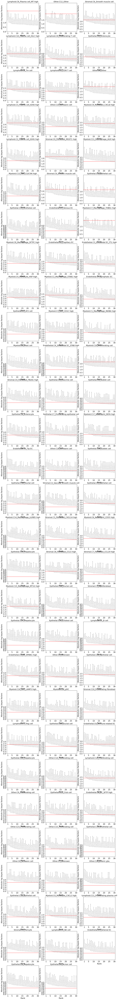

In [68]:
fig = sca.plotting.plot_abs_bfs(query_pbmc, yt_step=0.5, scale_y=2.5, fontsize=3)

# Step3

### Terms name

In [ ]:
# query_pbmc_bfscores_all = pd.read_csv((output_dir + 'train_query_bfscores_recluster_new.csv'), index_col = 0) 
term_name_use = pd.DataFrame()
for terms in query_pbmc_bfscores_all.columns: 
    term_temp = query_pbmc_bfscores_all[[terms]]
    term_temp = term_temp.sort_values(by = [terms])
    term_temp1 = term_temp.iloc[0:10]
    term_temp2 = term_temp.iloc[len(query_pbmc_bfscores_all)-10:len(query_pbmc_bfscores_all)]
    term_temp = pd.concat([term_temp1, term_temp2], axis = 0)
    term_name_use = term_name_use.append(pd.DataFrame(term_temp.index))
    
term_name_use.columns = ['terms'] 
term_name_use.index = term_name_use['terms']
term_name_use = term_name_use.drop_duplicates(subset = ['terms'], keep = 'first', inplace=False)
term_name_use.to_csv(output_dir + 'train_query_top_term.csv')

### Terms info

In [ ]:
siginfo = pd.read_csv('sigmetrics_high_cp_2020.csv')
siginfo.index = siginfo['sig_id']

In [ ]:
siginfo_new = pd.DataFrame()
for term in term_name_use.iloc[:,0].to_list():
    term_temp = term.replace(r'_DOWN','')
    term_temp = term_temp.replace(r'_UP','')
    if ('constrained' in term_temp) == False:
        term_temp_info = siginfo.loc[term_temp]
        term_temp_info['uniqueID'] = term
        siginfo_new = siginfo_new.append(term_temp_info)
        
siginfo_new.index = siginfo_new['uniqueID']  ## sig_id
siginfo_new.to_csv(output_dir + 'train_query_term_use_info_new.csv')

### Mask genes

In [85]:
for terms in range(len(siginfo_new.index)): 
        q_intr_cvae.term_genes(siginfo_new.index[terms]).to_csv(
            output_gene_dir + 'train_query_term_' + siginfo_new.index[terms] +'_genes.csv', index = False)

## Save

In [87]:
del query_pbmc.obsp['distances']
del query_pbmc.obsp['connectivities']
del query_pbmc.obsm['X_cvae']

In [89]:
query_pbmc.write(adata_train_query, compression = True)

In [3]:
query_pbmc_meta = query_pbmc.obs
query_pbmc_meta_umap = pd.DataFrame(query_pbmc.obsm['X_umap'], index = query_pbmc.obs.index, columns = ['umap_1', 'umap_2'])
query_pbmc_meta = pd.concat([query_pbmc_meta, query_pbmc_meta_umap], axis = 1)

In [91]:
query_pbmc_meta.to_csv(adata_train_query_metadata)